<a href="https://colab.research.google.com/github/IgorRahzel/Projects/blob/main/ImageCaptionGenerator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# RNN vs Transformer

### Project Description

This notebook documents the process of building, training, and evaluating two deep learning models for the task of Image Captioning, using the Flickr8k dataset.

The main objective is to perform a detailed comparative analysis between two popular architectures:
1.  A classic approach based on **CNN + RNN (LSTM)**.
2.  A modern architecture based on **CNN + Transformer**.

The final analysis explores the performance of both models quantitatively (through loss curves and the BLEU score metric) and qualitatively (by examining examples of generated captions), discussing the trade-offs between model complexity, overfitting, and the final quality of the results.

# Importing Flickr8K dataset

## Flickr8K Dataset Description

The Flickr8K dataset is a widely used benchmark for image captioning tasks. It comprises **8,000 images**, each paired with **five distinct captions (ground truth descriptions)**. These captions were manually generated by human annotators, offering a rich variety of linguistic expressions for the same visual content.

A key feature of Flickr8K is its pre-defined splits for training, validation, and testing. This standardized partitioning ensures that model comparisons are fair and consistent across different research efforts. Specifically:
- **Training Set:** Used to train the model's parameters.
- **Validation Set:** Used to tune hyperparameters and monitor for overfitting during training.
- **Test Set:** A completely unseen set of images and captions used for the final, unbiased evaluation of the model's performance.

This structured dataset allows for robust development and evaluation of image captioning systems.

In [1]:
!mkdir data
!mkdir data/flickr8k
!wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip -O data/flickr8k/Flickr8k_text.zip #Especifica o diretório de saida com o -O
!wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip -O data/flickr8k/Flickr8k_Dataset.zip #Especifica o diretório de saida com o -O
!unzip data/flickr8k/Flickr8k_text.zip -d data/flickr8k/
!unzip data/flickr8k/Flickr8k_Dataset.zip -d data/flickr8k/

Streaming output truncated to the last 5000 lines.
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._342872408_04a2832a1b.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429142249_d09a32e291.jpg  
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._3429142249_d09a32e291.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429194423_98e911a101.jpg  
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._3429194423_98e911a101.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429351222_17ae744daf.jpg  
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._3429351222_17ae744daf.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429351964_531de1bf16.jpg  
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._3429351964_531de1bf16.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429391520_930b153f94.jpg  
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._3429391520_930b153f94.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429465163_fb8ac7ce7f.jpg  
  inflat

### Cleaning data

In [2]:
import re
import os

# (Make sure the 'captions_path' variable is set to the correct path)
captions_path = '/content/data/flickr8k/Flickr8k.lemma.token.txt' # Replace with your path if it's different
images_path = '/content/data/flickr8k/Flicker8k_Dataset'


# Regex pattern to find lines that DO NOT end with .jpg#
pattern = re.compile(r"^[^#]+\.jpg#")

print("Checking for malformed filenames...")
problematic_lines_checked = 0

with open(captions_path, 'r') as file:
  for line in file:
    if not pattern.match(line):
      if problematic_lines_checked < 10: # Let's check only the first 10
        # Extract the malformed filename
        malformed_name = line.split('#')[0]

        # Correct the name (a safe way is to split by the last '.' and take the first part)
        # Ex: "2258277193_586949ec62.jpg.1" -> "2258277193_586949ec62.jpg"
        if malformed_name.endswith(('.jpg.1', '.jpg.2', '.jpg.3', '.jpg.4')):
            correct_name = malformed_name.rsplit('.', 1)[0]
        else:
            correct_name = malformed_name # If it's not the expected pattern, keep the original

        # Build the full path to the file
        full_image_path = os.path.join(images_path, correct_name)

        # Check if the file exists
        file_exists = os.path.exists(full_image_path)

        print(f"Original name: '{malformed_name}' -> Corrected name: '{correct_name}' -> File exists? {file_exists}")
        problematic_lines_checked += 1

Checking for malformed filenames...
Original name: '2258277193_586949ec62.jpg.1' -> Corrected name: '2258277193_586949ec62.jpg' -> File exists? False
Original name: '2258277193_586949ec62.jpg.1' -> Corrected name: '2258277193_586949ec62.jpg' -> File exists? False
Original name: '2258277193_586949ec62.jpg.1' -> Corrected name: '2258277193_586949ec62.jpg' -> File exists? False
Original name: '2258277193_586949ec62.jpg.1' -> Corrected name: '2258277193_586949ec62.jpg' -> File exists? False
Original name: '2258277193_586949ec62.jpg.1' -> Corrected name: '2258277193_586949ec62.jpg' -> File exists? False


## Visualizing

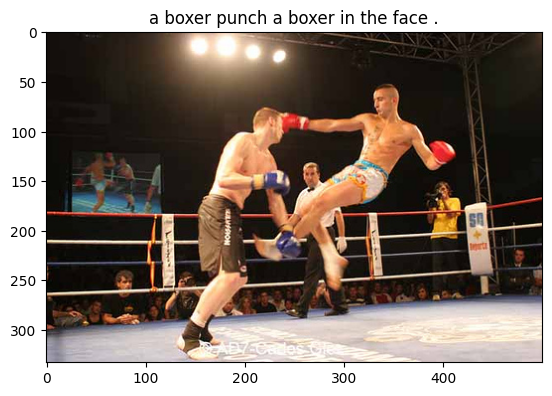

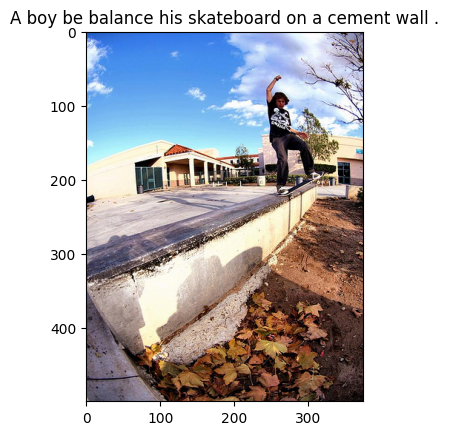

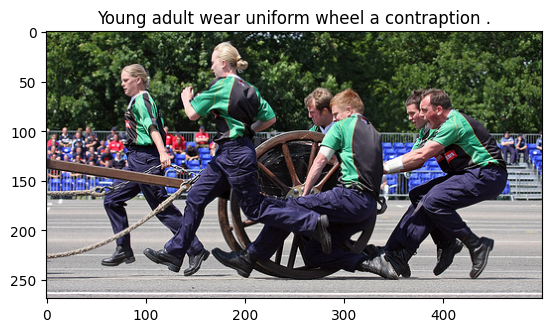

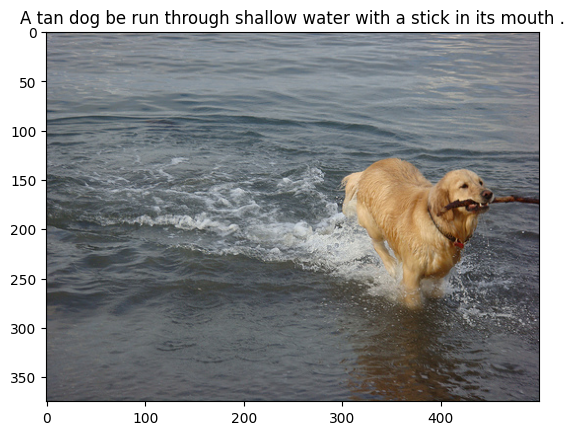

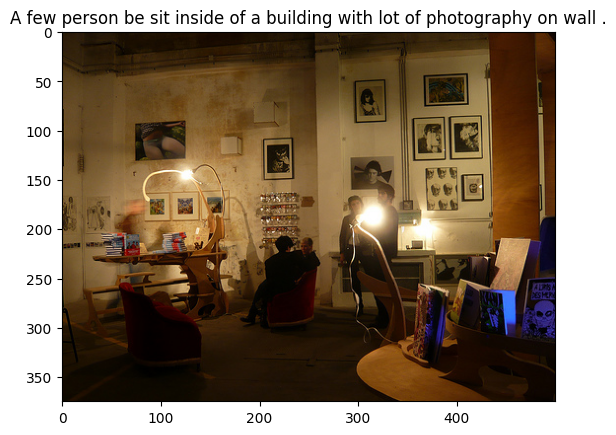

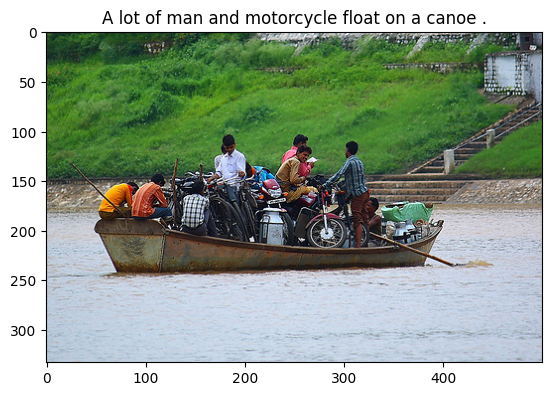

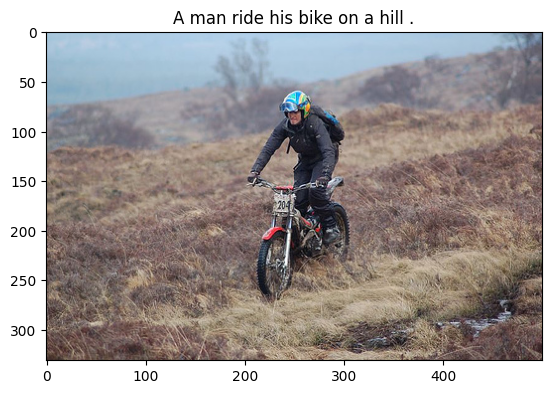

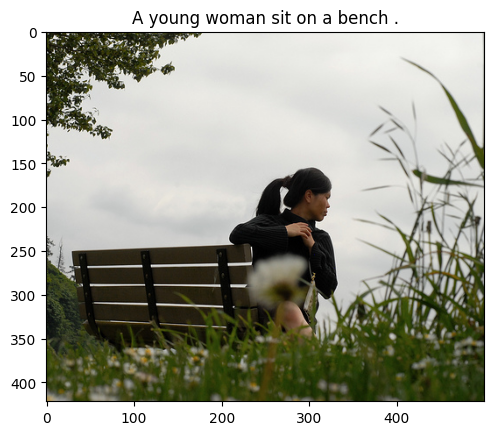

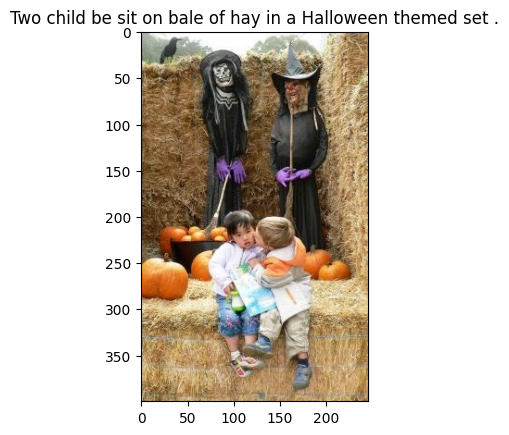

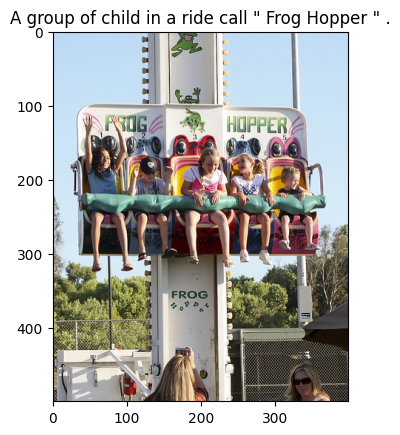

In [3]:
import os
import random
import matplotlib.pyplot as plt

captions_path = '/content/data/flickr8k/Flickr8k.lemma.token.txt'
images_path = '/content/data/flickr8k/Flicker8k_Dataset'


def show_image_with_captions(num_images = 10):


  # Get the number of lines in the  captions file
  with open(captions_path, 'r') as f:
    num_lines = sum(1 for line in f)

  # Get random captions to show
  random_lines = random.sample(range(num_lines),num_images)
  random_lines.sort()

  # Get the caption for each image
  caption_list = []
  image_list = []

  with open(captions_path, 'r') as file:
    for i,line in enumerate(file):
      if i in random_lines:
        line_split = line.split('#')
        #print(line_split)
        image_name = line_split[0]
        caption = line_split[1].split('\t')[1]

        image_list.append(image_name)
        caption_list.append(caption[:-1])


  # Plot images with their caption
  for i in range(num_images):
    image_path = os.path.join(images_path,image_list[i])
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.title(caption_list[i])
    plt.show()


show_image_with_captions(num_images=10)




# Vocabulary

## Vocabulary Class Definition

Before we can feed text data into our models, we need to convert words into numbers that the model can understand. This process is called **numericalization**. The `Vocabulary` class is a crucial helper for this task.

Its main responsibilities are:
1.  **Building a Vocabulary:** It scans all the captions from the training dataset and creates a dictionary of all unique words that appear more frequently than a given `freq_threshold`. This helps filter out rare words and typos, keeping the vocabulary size manageable.
2.  **Word-to-Index Mapping (`stoi`):** It creates a mapping from each word (string) to a unique integer index.
3.  **Index-to-Word Mapping (`itos`):** It creates a reverse mapping from each index back to its corresponding word, which is essential for decoding the model's output back into human-readable text.
4.  **Handling Special Tokens:** It includes special tokens that are vital for sequence processing:
    -   `<PAD>`: A padding token used to make all sequences in a batch have the same length.
    -   `<SOS>`: A "Start of Sequence" token to signal the beginning of a caption.
    -   `<EOS>`: An "End of Sequence" token to signal the end of a caption.
    -   `<UNK>`: An "Unknown" token to represent words that are not in our vocabulary.

Crucially, the vocabulary is built **only** using the captions from the training set to prevent any information from the validation or test sets from "leaking" into the training process.

In [4]:
from collections import Counter
import nltk

nltk.download('punkt')
nltk.download('punkt_tab')

class Vocabulary:
  def __init__(self, freq_threshold = 5):

    self.itos = {0:"<PAD>",1:"<SOS>",2:"<EOS>",3:"<UNK>"}
    self.stoi = {"<PAD>":0,"<SOS>":1,"<EOS>":2,"<UNK>":3}
    self.freq_threshold = freq_threshold

  def __len__(self):
    return len(self.itos)

  @staticmethod
  def tokenizer(text):
    return [tok.lower() for tok in nltk.word_tokenize(text)]

  def build_vocabulary(self,sentence_list):
    frequencies = Counter()
    idx = len(self.itos)

    for sentence in sentence_list:
      tokens = self.tokenizer(sentence)
      frequencies.update(tokens)

    for word, freq in frequencies.items():
            if freq >= self.freq_threshold:
                self.stoi[word] = idx
                self.itos[idx] = word
                idx += 1

  def numericalize(self,text):
    tokenized_text = self.tokenizer(text)

    return [
        self.stoi[token] if token in self.stoi else self.stoi["<UNK>"]
        for token in tokenized_text
    ]



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


# Dataset

## Custom Dataset Class (`ImageGenerator`)

To feed our data into a PyTorch model, we need a custom `Dataset` class. This class is responsible for loading, preprocessing, and serving individual data samples (an image and its corresponding caption) to the `DataLoader`.

Key responsibilities of this class include:
-   **`__init__`**: Initializes the dataset by loading the list of image filenames for a specific split (train, val, or test) and parsing the main captions file to create a dictionary mapping each image to its five reference captions.
-   **`__len__`**: Returns the total number of images in the dataset split.
-   **`__getitem__`**: Fetches a single data sample. Given an index `idx`, it retrieves the corresponding image from the disk, randomly selects one of its five captions, and applies the necessary image transformations (like resizing and normalization).

This structure allows the `DataLoader` to efficiently load batches of images and captions during the training and evaluation phases.

In [5]:
import torch
from torch.utils.data import Dataset
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
import random

class ImageGenerator(Dataset):
    """
    Dataset class for the Flickr8k dataset.
    Loads images and their corresponding captions based on a specific split file (train/val/test).
    """
    def __init__(self, captions_path, image_folder_path, split_file_path, transform=None):
        super().__init__()
        self.transform = transform
        self.image_folder_path = image_folder_path # Path to the folder with .jpg images

        # 1. Load the image filenames for the specific split (train/val/test).
        self.image_names = self._load_image_names(split_file_path)

        # 2. Load only the captions for the images in this split.
        self.images_captions_dict = self._load_captions(captions_path)

    def _load_image_names(self, split_file_path):
        """Helper function to read image names from a text file."""
        with open(split_file_path, 'r') as file:
            image_names = file.read().splitlines()
        return image_names

    def _load_captions(self, captions_path):
        """
        Helper function to load captions from the main captions file,
        filtered by the image names for this specific split.
        """
        dictionary = {}
        with open(captions_path, 'r') as file:
            for line in file:
                line_split = line.split('#')
                image_name = line_split[0]

                if image_name in self.image_names:
                    caption = line_split[1].split('\t')[1]
                    if image_name in dictionary:
                        dictionary[image_name].append(caption.strip())
                    else:
                        dictionary[image_name] = [caption.strip()]
        return dictionary

    def __len__(self):
        """Returns the number of images in this split."""
        return len(self.image_names)

    def __getitem__(self, idx):
        """Returns one sample from the dataset (image and a random caption)."""
        image_name = self.image_names[idx]
        image_path = os.path.join(self.image_folder_path, image_name)
        image = plt.imread(image_path)

        if len(image.shape) == 2:
            image = np.stack([image] * 3, axis=-1)

        captions = self.images_captions_dict[image_name]
        caption = random.choice(captions)

        if self.transform:
            image = self.transform(image)

        return image, caption

# DataLoaders and Collate Function

## DataLoaders

While the `Dataset` class retrieves individual samples, the `DataLoader` is a PyTorch utility that takes the `Dataset` and automates the process of creating mini-batches for training.

Its key responsibilities are:
-   **Batching:** Grouping multiple samples (images and captions) into a single batch.
-   **Shuffling:** Randomly shuffling the data at the beginning of each epoch to prevent the model from learning the order of the data.
-   **Parallel Loading:** Using multiple worker processes to load data in the background, which speeds up training by preventing the GPU from waiting for data.

## Custom Collate Function (`MyCollate`)

A standard `DataLoader` doesn't know how to handle samples of varying sizes, particularly our captions, which have different lengths. This is where a custom `collate_fn` comes in.

The `MyCollate` function is called by the `DataLoader` with a list of individual samples that will form a batch. Its job is to:
1.  **Process Images:** Stack the individual image tensors into a single batch tensor.
2.  **Process Captions:**
    -   Take the raw text captions for the batch.
    -   **Numericalize** each caption by converting its words to indices using the vocabulary.
    -   Add the `<SOS>` (Start of Sequence) and `<EOS>` (End of Sequence) tokens to each numericalized caption.
    -   **Pad** the sequences: Since captions in a batch have different lengths, it adds `<PAD>` tokens to the shorter ones until all sequences have the same length as the longest one in the batch.
3.  **Return:** Finally, it returns a clean, ready-to-use batch containing a tensor of images and a tensor of padded, numericalized captions.

In [6]:
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.nn.utils.rnn import pad_sequence

# --- 1. Define all necessary paths ---
captions_path = '/content/data/flickr8k/Flickr8k.lemma.token.txt'
image_folder_path = '/content/data/flickr8k/Flicker8k_Dataset'
train_split_path = '/content/data/flickr8k/Flickr_8k.trainImages.txt'
val_split_path = '/content/data/flickr8k/Flickr_8k.devImages.txt'
test_split_path = '/content/data/flickr8k/Flickr_8k.testImages.txt'

# --- 2. Build the Vocabulary from the training set ONLY ---
# Create a temporary training dataset instance just to get all training captions
temp_train_dataset = ImageGenerator(captions_path, image_folder_path, train_split_path)
all_train_captions = [caption for sublist in temp_train_dataset.images_captions_dict.values() for caption in sublist]

# Create and build the vocabulary
vocab = Vocabulary(freq_threshold=5)
vocab.build_vocabulary(all_train_captions)
print(f"Vocabulary built with {len(vocab)} words.")

# --- 3. Define Transformations ---
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# --- 4. Create the final Datasets for each split ---
train_dataset = ImageGenerator(captions_path, image_folder_path, train_split_path, transform=transform)
val_dataset = ImageGenerator(captions_path, image_folder_path, val_split_path, transform=transform)
test_dataset = ImageGenerator(captions_path, image_folder_path, test_split_path, transform=transform)

# --- 5. Create the updated Collate Function ---
class MyCollate:
    def __init__(self, pad_idx, vocab):
        self.pad_idx = pad_idx
        self.vocab = vocab

    def __call__(self, batch):
        images = [item[0].unsqueeze(0) for item in batch]
        images = torch.cat(images, dim=0)

        captions = [item[1] for item in batch]
        numericalized_captions = []
        for caption in captions:
            numerical_caption = [self.vocab.stoi["<SOS>"]]
            numerical_caption += self.vocab.numericalize(caption)
            numerical_caption.append(self.vocab.stoi["<EOS>"])
            numericalized_captions.append(torch.tensor(numerical_caption))

        padded_captions = pad_sequence(numericalized_captions, batch_first=True, padding_value=self.pad_idx)
        return images, padded_captions

# --- 6. Create the DataLoaders ---
pad_idx = vocab.stoi["<PAD>"]
collate_fn = MyCollate(pad_idx=pad_idx, vocab=vocab)

train_loader = DataLoader(dataset=train_dataset, batch_size=32, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(dataset=val_dataset, batch_size=32, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(dataset=test_dataset, batch_size=32, shuffle=False, collate_fn=collate_fn)

print("DataLoaders for train, validation, and test sets are ready!")

Vocabulary built with 2021 words.
DataLoaders for train, validation, and test sets are ready!


# CNN + LSTM Model

This section outlines the classic encoder-decoder architecture for image captioning, which serves as our baseline model.

The model consists of two main components:
1.  **Encoder (CNN):** A pretrained Convolutional Neural Network (CNN), specifically a ResNet-50, is used as a fixed feature extractor. It takes an input image and encodes it into a single, compact feature vector that represents the visual content of the image.
2.  **Decoder (LSTM):** A Long Short-Term Memory (LSTM) network, a type of Recurrent Neural Network (RNN), is used as the decoder. It receives the feature vector from the encoder as its initial input. Then, it generates the caption sequentially, predicting one word at a time based on the image context and the words it has previously generated.

The diagram below illustrates this flow, where the CNN processes the image, and the LSTM generates the caption word by word.

![Model](https://raw.githubusercontent.com/yunjey/pytorch-tutorial/master/tutorials/03-advanced/image_captioning/png/model.png)

## Encoder

### Encoder for the CNN + RNN Model

The `EncoderCNN` class serves as the vision backbone for our first model. Its job is to take a raw image and convert it into a compact, fixed-size feature vector that encapsulates the image's content.

Key features of this implementation:
-   **Architecture:** It uses a **ResNet-50** model, pretrained on the ImageNet dataset, which is a powerful and standard choice for feature extraction.
-   **Modification:** The original final layer of the ResNet (which classifies among 1000 ImageNet classes) is **removed and replaced** with a new fully connected (`nn.Linear`) layer. This new layer maps the high-level features extracted by the ResNet into a vector of size `embed_size`.
-   **Output:** For each input image, this encoder outputs a **single feature vector**. This vector acts as the initial "thought" or context that is fed into the LSTM decoder to kickstart the caption generation process.
-   **Fine-tuning:** It includes a `train_CNN` flag, which allows us to either keep the ResNet weights frozen (using it as a fixed feature extractor) or to fine-tune them during training.

In [7]:
from torchvision.models.resnet import resnet50
import torch.nn as nn

class EnconderCNN(nn.Module):
  def __init__(self,embed_size,train_CNN=False):
    super(EnconderCNN,self).__init__()

    self.train_CNN = train_CNN
    self.resnet = resnet50(pretrained=True)
    self.resnet.fc = nn.Linear(self.resnet.fc.in_features,embed_size)

    for name, param in self.resnet.named_parameters():
      if "fc" in name:
          param.requires_grad = True
      else:
          param.requires_grad = train_CNN

  def forward(self,images):
    features = self.resnet(images)
    return features

## Decoder for the CNN + RNN Model

The `DecoderRNN` class is the generative part of our CNN+RNN model. Its primary function is to take the image features provided by the encoder and sequentially generate a descriptive caption word by word.

Key components and their roles:
-   **`nn.Embedding`:** This layer converts the numerical word indices of the input caption into dense, continuous vectors called word embeddings. These embeddings capture semantic relationships between words.
-   **`nn.LSTM`:** This is the core of the decoder. It's a Long Short-Term Memory network, a type of Recurrent Neural Network (RNN) particularly effective at processing sequences. It learns to maintain a "memory" of the caption generated so far and the image context to predict the next word.
    -   It receives the image feature vector as an initial "context" (via concatenation with the first word embedding).
    -   `batch_first=True` means the input and output tensors will have dimensions `(batch_size, sequence_length, feature_size)`, which is convenient for batch processing.
-   **`nn.Linear`:** A fully connected layer that takes the hidden states from the LSTM and maps them to the size of the vocabulary. This layer's output can then be passed through a softmax function (often implicitly handled by the loss function) to produce probabilities for each word in the vocabulary.
-   **`nn.Dropout`:** A regularization technique applied to the embeddings to prevent overfitting by randomly setting a fraction of the embedding elements to zero during training.

### `forward` Method Flow:
1.  **Embed Captions:** The input `captions` (sequence of word indices) are converted into `embeddings`.
2.  **Concatenate Features:** The `features` (image vector from the encoder) are prepended to the `embeddings` sequence. This means the LSTM processes the image context first, followed by the actual caption words.
3.  **LSTM Processing:** The concatenated sequence of embeddings (image feature + word embeddings) is fed into the LSTM. The LSTM processes this sequence, updating its internal state and producing a sequence of hidden states (`hiddens`).
4.  **Linear Layer:** The `hiddens` are then passed through the `linear` layer to produce raw scores (logits) for each word in the vocabulary, which represent the model's prediction for the next word in the sequence.

In [8]:
class DecoderRNN(nn.Module):
  def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, dropout=0.5):
    super(DecoderRNN, self).__init__()
    self.embed = nn.Embedding(vocab_size, embed_size)
    self.lstm = nn.LSTM(input_size=embed_size,
                        hidden_size=hidden_size,
                        num_layers=num_layers,
                        batch_first=True,
                        dropout=(dropout if num_layers > 1 else 0.0))

    self.linear = nn.Linear(hidden_size, vocab_size)
    self.dropout = nn.Dropout(dropout)
    self.hidden_size = hidden_size
    self.num_layers = num_layers

  def forward(self, features, captions):

    # Get the embeddings from the captions
    embeddings = self.embed(captions)

    # Add the image embedding to the captions embeddings sequence
    embeddings = torch.cat((features.unsqueeze(1), embeddings), dim=1)

    # Apply dropout as a regularization strategy
    embeddings = self.dropout(embeddings)

    # Send embeddings through the RNN
    hiddens, _ = self.lstm(embeddings)

    # Send the RNN output through the linear layer
    outputs = self.linear(hiddens)

    return outputs





## CNN + RNN Model - Combined Architecture

This `ImageCaptionGenerator` class brings together the `EncoderCNN` and `DecoderRNN` modules into a single end-to-end model.

-   **`__init__`**: Initializes instances of the encoder and decoder.
-   **`forward`**: Defines the data flow:
    1.  The input `images` are passed through the `encoder` to produce image `features`.
    2.  These `features` along with the input `captions` are passed through the `decoder` to generate the output `outputs` (predicted caption sequences).

This class represents the complete architecture for the baseline CNN+RNN image captioning model.

In [9]:
class ImageCaptionGenerator(nn.Module):
  def __init__(self,embed_size, hidden_size, vocab_size, num_layers=1, dropout=0.5):
    super(ImageCaptionGenerator, self).__init__()
    self.encoder = EnconderCNN(embed_size, train_CNN=False)
    self.decoder = DecoderRNN(embed_size, hidden_size, vocab_size, num_layers, dropout)

  def forward(self,images,captions):
    features = self.encoder(images)
    outputs = self.decoder(features,captions)

    return outputs

In [10]:
import torch
import torch.nn as nn

# Assume EnconderCNN, DecoderRNN, and ImageCaptionGenerator classes are defined.
# Ensure vocab object is available.

def generate_caption_rnn(model, image_tensor, vocab, device, max_length=50):
    """
    Generates a caption for a given image tensor using the CNN-RNN model.
    Returns a list of word tokens, excluding <SOS> and <EOS>.
    """
    model.eval() # Set model to evaluation mode

    # Add batch dimension if needed and move to device
    if len(image_tensor.shape) == 3:
        image_tensor = image_tensor.unsqueeze(0)
    image_tensor = image_tensor.to(device)

    generated_tokens = [] # List to store the generated words (strings)

    with torch.no_grad(): # Disable gradient calculation
        features = model.encoder(image_tensor) # Get image features [1, embed_size]

        # Initialize LSTM states (h_n, c_n) to None for the first step
        states = None

        # --- First LSTM Input: Process the image features ---
        # Input shape needs to be [batch_size, seq_len, input_size] = [1, 1, embed_size]
        lstm_input = features.unsqueeze(1)
        hiddens, states = model.decoder.lstm(lstm_input, states) # LSTM processes the image feature

        # --- Second LSTM Input: Process the <SOS> token ---
        # Use the states obtained from processing the image features
        sos_index = vocab.stoi["<SOS>"]
        current_word_embedding = model.decoder.embed(
            torch.tensor([sos_index]).to(device)
        ).unsqueeze(1) # [1, 1, embed_size]

        # Loop to generate subsequent words
        for _ in range(max_length):
            # Pass current word embedding and previous states to LSTM
            hiddens, states = model.decoder.lstm(current_word_embedding, states)
            # hiddens shape: [1, 1, hidden_size]

            # Apply dropout (matching DecoderRNN forward)
            hiddens_dropout = model.decoder.dropout(hiddens)

            # Get output logits from the linear layer
            # Squeeze the sequence dimension before linear layer
            outputs = model.decoder.linear(hiddens_dropout.squeeze(1)) # outputs shape: [1, vocab_size]

            # Get predicted word index
            predicted_index = outputs.argmax(1).item() # Use .item() to get scalar index
            predicted_word = vocab.itos[predicted_index]

            # Stop if <EOS> is predicted
            if predicted_word == "<EOS>":
                break

            # Add predicted word (string) to the list
            generated_tokens.append(predicted_word)

            # Prepare the embedding of the predicted word for the next iteration
            current_word_embedding = model.decoder.embed(
                torch.tensor([predicted_index]).to(device)
            ).unsqueeze(1) # [1, 1, embed_size]

    model.train() # Set model back to training mode
    return generated_tokens



This function provides a universal interface to generate a descriptive caption for a given image using either the CNN+RNN or CNN+Transformer model. It performs inference in an autoregressive manner, predicting one word at a time until an `<EOS>` token is generated or the `max_length` is reached.

In [11]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

def show_and_generate_caption(model, val_dataset, device, vocab,generate_caption_function):
    """
    Selects a random image from the validation set, generates a caption,
    and displays the image along with the predicted and ground truth captions.
    """
    # Set model to evaluation mode
    model.eval()

    # --- Step 1: Get a random image and its ground truth captions ---

    # Get a random index directly from the validation dataset
    random_idx = np.random.randint(0, len(val_dataset))

    # Get the image name using this index
    image_name = val_dataset.image_names[random_idx]

    # Get all 5 ground truth captions using the image name as the key
    ground_truth_captions = val_dataset.images_captions_dict[image_name]

    # Get the transformed image tensor to feed into the model
    transformed_image, _ = val_dataset[random_idx]


    # --- Step 2: Generate the predicted caption ---

    predicted_caption_list = generate_caption_function(model, transformed_image, vocab, device)
    # Remove the <SOS> token if it's there and join the words
    if predicted_caption_list and predicted_caption_list[0] == '<SOS>':
        predicted_caption_list = predicted_caption_list[1:]

    # Remove the <EOS> token if it's the last word
    if predicted_caption_list and predicted_caption_list[-1] == '<EOS>':
        predicted_caption_list = predicted_caption_list[:-1]

    predicted_caption = " ".join(predicted_caption_list)


    # --- Step 3: Display everything ---

    # To display the image, we read it directly from the file
    image_path = os.path.join(val_dataset.image_folder_path, image_name)
    image_to_show = plt.imread(image_path)

    plt.imshow(image_to_show)
    plt.axis('off')
    plt.show()

    print("--- PREDICTED CAPTION ---")
    print(predicted_caption)
    print("\n--- GROUND TRUTH CAPTIONS ---")
    for caption in ground_truth_captions:
        print(caption)
    print('\n')

## Setting Hyperparameters for CNN + RNN model

In [12]:
# Device configuration
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
embed_size = 256
hidden_size = 256
num_layers = 1
learning_rate = 3e-4
num_epochs = 200 # Vamos começar com 5 épocas

# Initialize model, loss, and optimizer
model = ImageCaptionGenerator(
    embed_size=embed_size,
    hidden_size=hidden_size,
    vocab_size=len(vocab),
    num_layers=num_layers
).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=vocab.stoi["<PAD>"])
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 196MB/s]


## Creating folder in Google Drive to save trained model

In [13]:
from google.colab import drive
drive.mount('/content/drive')

SAVE_PATH_CNN_RNN = '/content/drive/MyDrive/CNN_RNN_model/'
os.makedirs(SAVE_PATH_CNN_RNN, exist_ok=True)

checkpoint_file = os.path.join(SAVE_PATH_CNN_RNN, 'checkpoint.pth')

Mounted at /content/drive


## Training Function CNN + RNN

This `train` function manages the entire training and validation process for the image captioning models.

Its core functionalities include:
-   **Epoch Loop:** Iterates through specified training `num_epochs`.
-   **Checkpointing & Resumption:** Supports loading from an existing `checkpoint_path` to resume training or saving the best-performing model based on validation loss.
-   **Training Phase:**
    -   Processes batches from `train_loader`, calculates `CrossEntropyLoss`, and updates model weights.
    -   Tracks and records training loss.
-   **Validation Phase:**
    -   Evaluates the model on `val_loader` without updating weights.
    -   Tracks and records validation loss.
-   **Early Stopping:** Prevents overfitting by stopping training if validation loss doesn't improve for `patience` epochs.
-   **Progress Tracking:** Uses `tqdm` to show real-time progress for both training and validation.

The function returns the history of training and validation losses for analysis.

In [14]:
from tqdm import tqdm
import torch

def train(model, device, train_loader, val_loader, val_dataset, vocab, optimizer, criterion, num_epochs=10, patience=15,checkpoint_path = None):
  """
  Function to train and validate the image captioning model.
  """
  # Keep track of the loss history
  start_epoch = 0
  train_loss_history = []
  val_loss_history = []
  best_val_loss = float('inf')
  patience_counter = 0

  if checkpoint_path and os.path.exists(checkpoint_path):
    print(f"Checkpoint found! Loading from {checkpoint_path}...")
    checkpoint = torch.load(checkpoint_path)

    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    train_loss_history = checkpoint['train_loss_history']
    val_loss_history = checkpoint['val_loss_history']
    best_val_loss = checkpoint['best_val_loss']
    print(f"Resuming training from epoch {start_epoch}")
  else:
    print("No checkpoint found. Starting training from scratch.")

  for epoch in range(start_epoch, num_epochs):

    # --- Training Phase ---
    model.train() # Set the model to training mode
    train_loss_epoch = 0.0

    # Use tqdm for a progress bar
    train_progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]")
    for images, captions in train_progress_bar:
      images = images.to(device)
      captions = captions.to(device)

      # Zero the gradients
      optimizer.zero_grad()

      # Forward pass
      outputs = model(images, captions)

      # Reshape for CrossEntropyLoss and calculate loss
      preds = outputs[:, :-1, :].reshape(-1, outputs.shape[2])
      targets = captions.reshape(-1)
      loss = criterion(preds, targets)

      # Backward pass and optimize
      loss.backward()
      optimizer.step()

      train_loss_epoch += loss.item()
      train_progress_bar.set_postfix(loss=loss.item())

    # --- Validation Phase ---
    model.eval() # Set the model to evaluation mode
    val_loss_epoch = 0.0

    with torch.no_grad(): # Disable gradient calculation
      val_progress_bar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]")
      for images, captions in val_progress_bar:
        images = images.to(device)
        captions = captions.to(device)

        # Forward pass
        outputs = model(images, captions)

        # Reshape and calculate loss
        preds = outputs[:, :-1, :].reshape(-1, outputs.shape[2])
        targets = captions.reshape(-1)
        loss = criterion(preds, targets)

        val_loss_epoch += loss.item()
        val_progress_bar.set_postfix(loss=loss.item())

    # Calculate average losses for the epoch
    avg_train_loss = train_loss_epoch / len(train_loader)
    avg_val_loss = val_loss_epoch / len(val_loader)

    # Append to history
    train_loss_history.append(avg_train_loss)
    val_loss_history.append(avg_val_loss)

    print(f"Epoch {epoch+1} Summary: Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

    # --- Epoch Summary ---

    # Check if model performed better on validation set
    if avg_val_loss < best_val_loss:
      print(f"Validation loss improved from {best_val_loss:.4f} to {avg_val_loss:.4f}. Saving checkpoint...")
      best_val_loss = avg_val_loss
      patience_counter = 0

      # Store data in a dictionary
      if checkpoint_path:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'best_val_loss': best_val_loss,
            'train_loss_history': train_loss_history,
            'val_loss_history': val_loss_history,
        }, checkpoint_path)

    else:
      patience_counter += 1
      if patience_counter >= patience:
          print(f"Early stopping triggered after {patience} epochs with no improvement.")
          break


    # Show model captions in a image
    if (epoch + 1) % 3 == 0:
      show_and_generate_caption(model, val_dataset, device, vocab,generate_caption_rnn)



  print("Training complete!")


  return train_loss_history, val_loss_history

In [15]:
# train(model, device, train_loader, val_loader, val_dataset, vocab, optimizer, criterion, num_epochs= num_epochs,checkpoint_path = checkpoint_file)

## Loss History Plotter - CNN + RNN

This utility function is designed to visualize the training and validation loss curves from a saved model checkpoint. It loads the loss history, plots it, and displays a graph, allowing for easy monitoring of model learning progress and detection of overfitting.



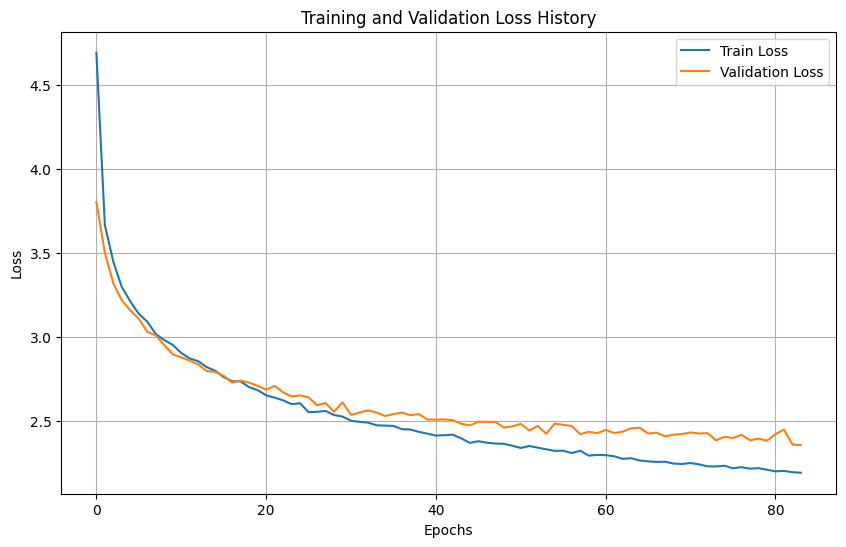

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch

def plot_loss_history(checkpoint_path):
    """
    Plots the training and validation loss from a saved checkpoint.
    """
    if os.path.exists(checkpoint_path):

        checkpoint = torch.load(checkpoint_path, map_location=torch.device('cpu'))

        train_loss = checkpoint.get('train_loss_history', [])
        val_loss = checkpoint.get('val_loss_history', [])

        if not train_loss or not val_loss:
            print("Loss history not found in the checkpoint.")
            return

        plt.figure(figsize=(10, 6))
        plt.plot(train_loss, label='Train Loss')
        plt.plot(val_loss, label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss History')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print(f"Checkpoint file not found at: {checkpoint_path}. Cannot plot history.")

plot_loss_history(checkpoint_file)

# Transformer

![Arquitetura da Imagem](https://drive.google.com/uc?export=view&id=1kXq5hnmOeJMO0SKi9hBe1Vc4_pHkz6ax)

## CNN Encoder for the Transformer Model (`CNN_Encoder_Transformers`)

This class acts as the visual encoder for the CNN+Transformer model. Unlike the RNN encoder which produces a single feature vector, this encoder is designed to output a **sequence of feature vectors** (or "patches") that the Transformer's attention mechanism can process.

Key aspects:
-   **Architecture:** Utilizes a pretrained **ResNet-50** as the backbone.
-   **Feature Extraction:** Instead of removing only the final classification layer, it removes the last two layers of the ResNet (the adaptive average pooling and the fully connected layer). This retains the **spatial information** of the features (e.g., a `7x7x2048` tensor for a 224x224 input image).
-   **Feature Reshaping:** The extracted features are reshaped from `(batch_size, 2048, 7, 7)` to `(batch_size, 49, 2048)`. This creates a sequence of 49 spatial feature vectors, each of dimension 2048. These 49 vectors represent different "patches" or regions of the image.
-   **Projection Layer:** A linear layer (`self.projection`) then maps these 2048-dimensional feature vectors to the `embed_size` (e.g., 256 or 512), which is the dimensionality expected by the Transformer decoder.
-   **`train_CNN` Flag:** Allows for fine-tuning of the ResNet weights or keeping them frozen.

The output is a sequence of `(batch_size, num_patches, embed_size)` feature vectors, ready to be consumed by the Transformer's cross-attention mechanism.

In [17]:
import torch
import torchvision.models as models
import torch.nn as nn


class CNN_Encoder_Transformers(nn.Module):
    """
    Encoder part of the model. Takes an image, extracts features,
    and projects them to the desired embedding size.
    """
    def __init__(self, embed_size, train_CNN=False):
        super(CNN_Encoder_Transformers, self).__init__()
        self.embed_size = embed_size
        resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        for param in resnet.parameters():
            param.requires_grad_(train_CNN)
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)
        self.encoder_dim = 2048
        self.projection = nn.Linear(self.encoder_dim, self.embed_size)
        self.relu = nn.ReLU()

    def forward(self, images):
        features = self.resnet(images)

        batch_size = features.shape[0]
        features = features.reshape(batch_size, self.encoder_dim, -1)
        features = features.permute(0, 2, 1)

        projected_features = self.relu(self.projection(features))

        return projected_features

## Positional Encoding (`PositionalEncoding`)

Unlike Recurrent Neural Networks (RNNs) that inherently process sequences word by word, Transformer models process all words in a sequence simultaneously. This parallel processing means they lose the intrinsic information about the order of words. The `PositionalEncoding` layer addresses this by injecting information about the **relative or absolute position** of each word in the sequence.

Key features:
-   **Sinusoidal Pattern:** It uses sine and cosine functions of different frequencies to create unique positional vectors for each position in the sequence. This allows the model to learn to attend to relative positions.
-   **Additive Encoding:** The generated positional encodings are simply **added** to the word embeddings (or image features). This allows the model to retain the original semantic information of the embeddings while gaining positional awareness.
-   **Non-learnable:** These encodings are fixed and not learned during training, relying on the elegant properties of sine/cosine functions.
-   **Dropout:** A dropout layer is applied after adding the positional encodings to provide regularization, preventing the model from overly relying on specific positional patterns.

This layer ensures that the Transformer decoder can understand the order of words in the caption and distinguish between words at different positions.

In [18]:
import torch
import torch.nn as nn
import math


class PositionalEncoding(nn.Module):
    def __init__(self, embed_size, dropout_p=0.1, max_len=50):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout_p)
        pe = torch.zeros(max_len, embed_size)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, embed_size, 2).float() * (-math.log(10000.0) / embed_size))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe.unsqueeze(0))

    def forward(self, x):
        """
        Args:
            x: Tensor, shape [batch_size, seq_len, embed_size]
        """
        x = x + self.pe[:, :x.size(1), :]
        return self.dropout(x)

## Transformer Decoder (`DecoderTransformer`)

This `DecoderTransformer` class is the core component responsible for generating captions in the CNN+Transformer model. It leverages the self-attention and cross-attention mechanisms of the Transformer architecture to create highly contextualized word predictions.

Key components and their roles:
-   **`nn.Embedding`:** Converts input word indices into dense embedding vectors.
-   **`PositionalEncoding`:** Injects positional information into the word embeddings, as Transformers process sequences in parallel and need explicit ordering cues.
-   **`nn.TransformerDecoderLayer`:** This is a single building block of the Transformer decoder. Each layer contains:
    -   **Multi-head Self-Attention:** Allows the decoder to weigh the importance of different words in the *already generated part of the caption* when predicting the next word.
    -   **Multi-head Cross-Attention:** Enables the decoder to attend to relevant parts of the *image features* (provided by the CNN encoder) when generating each word. This is where the visual context is incorporated.
    -   **Feed-Forward Network:** A simple neural network applied to each position independently.
-   **`nn.TransformerDecoder`:** Stacks multiple `TransformerDecoderLayer` instances (defined by `num_layers`) to create a deep and powerful decoder.
-   **`nn.Linear`:** The final fully connected layer that maps the Transformer's output (embedding space) to the `vocab_size`, producing logits for each possible word.

### `forward` Method Flow:
1.  **Embed & Position:** Input `captions` are first embedded and then combined with positional encodings.
2.  **Attention Masking:** A `square_subsequent_mask` is generated. This is crucial for **autoregressive generation**, preventing the decoder from "cheating" by looking at future words in the caption when predicting the current word.
3.  **Transformer Decoding:** The embeddings (target `tgt`) and image `features` (memory `memory`) are fed into the `transformer_decoder`. The `tgt_mask` ensures that self-attention only considers past and current positions.
4.  **Final Prediction:** The output from the Transformer decoder is passed through the final `linear` layer to produce the predicted word logits for each position in the caption.

In [19]:
class DecoderTransformer(nn.Module):
    def __init__(self, embed_size, vocab_size, num_heads, num_layers, dropout):
        super(DecoderTransformer, self).__init__()
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.pos_encoder = PositionalEncoding(embed_size, dropout_p=dropout)
        decoder_layer = nn.TransformerDecoderLayer(d_model=embed_size, nhead=num_heads,
                                                 batch_first=True, dropout=dropout)

        self.transformer_decoder = nn.TransformerDecoder(decoder_layer, num_layers=num_layers)
        self.linear = nn.Linear(embed_size, vocab_size)

    def forward(self, features, captions):
        embeddings = self.embed(captions)
        embeddings = self.pos_encoder(embeddings)

        seq_length = captions.shape[1]
        mask = nn.Transformer.generate_square_subsequent_mask(seq_length).to(captions.device)

        output = self.transformer_decoder(
            tgt=embeddings,
            memory=features,
            tgt_mask=mask
        )

        output = self.linear(output)
        return output

## CNN + Transformer Model - Combined Architecture

This `TransformerImageCaptionGenerator` class integrates the `CNN_Encoder_Transformers` and `DecoderTransformer` modules into a complete, end-to-end image captioning model.

-   **`__init__`**: Initializes instances of both the CNN encoder (for image feature extraction) and the Transformer decoder (for caption generation).
-   **`forward`**: Defines the sequential data flow:
    1.  Input `images` are first processed by the `encoder` to extract a sequence of visual `features`.
    2.  These visual `features`, along with the input `captions`, are then passed to the `decoder` to generate the final `outputs` (predicted caption sequences).

This class represents the full CNN+Transformer architecture for image captioning.

In [20]:
class TransformerImageCaptionGenerator(nn.Module):
    """
    The complete end-to-end model that joins the encoder and decoder.
    """
    def __init__(self, embed_size, vocab_size, num_heads, num_layers, dropout):
        super(TransformerImageCaptionGenerator, self).__init__()

        self.encoder = CNN_Encoder_Transformers(embed_size=embed_size)

        self.decoder = DecoderTransformer(embed_size, vocab_size, num_heads, num_layers, dropout)


    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)

        return outputs

## Setting Hyperparameters for CNN + Transformer model

In [21]:
# Hyperparameters
embed_size = 256
vocab_size = len(vocab)
num_heads = 8
num_layers = 2
dropout = 0.0
learning_rate = 3e-4
num_epochs = 200

# Initialize model
model = TransformerImageCaptionGenerator(
    embed_size,
    vocab_size,
    num_heads,
    num_layers,
    dropout
).to(device)


optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

criterion = nn.CrossEntropyLoss(ignore_index=vocab.stoi["<PAD>"])

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 186MB/s]


In [22]:
from google.colab import drive
drive.mount('/content/drive')

SAVE_PATH_CNN_TRANSFORMER = '/content/drive/MyDrive/CNN_TRANSFORMER_model/'
os.makedirs(SAVE_PATH_CNN_TRANSFORMER, exist_ok=True)

checkpoint_file_transformer = os.path.join(SAVE_PATH_CNN_TRANSFORMER, 'checkpoint.pth') # Corrected typo

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [23]:
import torch
import torch.nn as nn
# Assume CNN_Encoder_Transformers, PositionalEncoding,
# DecoderTransformer, and TransformerImageCaptionGenerator classes are already defined.
# Ensure the `vocab` object is also available.

def generate_caption_transformer(model, image_tensor, vocab, device, max_length=50):
    """
    Generates a caption for a given image tensor using the CNN-Transformer model.
    The returned caption will NOT include <SOS> or <EOS> tokens.

    Args:
        model (TransformerImageCaptionGenerator): The trained CNN-Transformer image captioning model.
        image_tensor (torch.Tensor): The input image tensor (can be 3D for a single image or 4D for a batch).
        vocab: The Vocabulary object with .stoi and .itos attributes.
        device: The device to run the inference on (e.g., 'cuda' or 'cpu').
        max_length: Maximum length of the generated caption.

    Returns:
        list: A list of string tokens representing the generated caption.
    """
    model.eval() # Set the model to evaluation mode

    # Add batch dimension if needed and move to device
    if len(image_tensor.shape) == 3:
        image_tensor = image_tensor.unsqueeze(0)
    image_tensor = image_tensor.to(device)

    generated_tokens = [] # List to store the generated words (strings)

    with torch.no_grad(): # Disable gradient calculation for inference
        # 1. Extract image features using the encoder
        # features shape: [batch_size, num_patches, embed_size] (e.g., [1, 49, 256])
        features = model.encoder(image_tensor)

        # 2. Initialize the target sequence with the <SOS> token
        # trg_tensor shape: [batch_size, current_seq_len] (e.g., [1, 1])
        trg_tensor = torch.LongTensor([vocab.stoi["<SOS>"]]).unsqueeze(0).to(device)

        # 3. Loop to generate the caption word by word
        for _ in range(max_length):
            # The DecoderTransformer.forward expects 'features' as 'memory' and 'trg_tensor' as 'tgt'.
            # It internally handles the `square_subsequent_mask` to prevent attention to future tokens.

            # output shape: [batch_size, current_seq_len, vocab_size]
            output = model.decoder(features, trg_tensor)

            # Predict the next word by taking the output corresponding to the LAST token in the 'trg_tensor' sequence
            # output[:, -1, :] shape: [batch_size, vocab_size] (e.g., [1, vocab_size])
            predicted_index = output.argmax(2)[:, -1].item() # .item() to extract the scalar
            predicted_word = vocab.itos[predicted_index]

            # 4. Check if the <EOS> token was predicted to stop generation
            if predicted_word == "<EOS>":
                break # Exit the loop if <EOS> is predicted

            # 5. Add the predicted word to the list of generated tokens
            # (Note that <SOS> and <EOS> are never added to this list)
            generated_tokens.append(predicted_word)

            # 6. Append the index of the predicted word to the target sequence for the next iteration
            # Concatenate along the sequence dimension (dim=1)
            trg_tensor = torch.cat((trg_tensor, torch.LongTensor([[predicted_index]]).to(device)), dim=1)

    model.train() # Set the model back to training mode
    return generated_tokens

## Transformer Model Training Function (`train_transformer`)

This function is specifically designed to handle the training and validation loop for the `TransformerImageCaptionGenerator` model. It shares many robust features with the `train` function (presumably used for the RNN model) but is adapted for the Transformer's specific input/output handling.

Key functionalities include:
-   **Checkpointing & Resumption:** Similar to the RNN training, it supports loading from an existing checkpoint to resume training from a specific epoch and state, including the `epochs_no_improve` counter for early stopping.
-   **Training Phase:**
    -   Sets the model to `model.train()` mode.
    -   Processes batches from `train_loader`, but importantly, it creates `captions_input` (all tokens except the last) for the decoder's input and `captions_target` (all tokens except the first) for loss calculation, consistent with Transformer's shifted target mechanism.
    -   Calculates `CrossEntropyLoss`, performs backpropagation, and updates model weights.
-   **Validation Phase:**
    -   Sets the model to `model.eval()` mode and disables gradient calculations.
    -   Evaluates the model on `val_loader` using the same input/target splitting as in training.
-   **Early Stopping:** Implements the `patience` mechanism to halt training if the validation loss doesn't improve over a set number of epochs, effectively preventing overfitting.
-   **Best Model Saving:** Automatically saves the model's `state_dict` to a `best_model.pth` file whenever a new lowest validation loss is achieved, ensuring the best performing weights are preserved.
-   **Loss Tracking & Progress:** Records training and validation loss histories and uses `tqdm` for visual progress tracking.
-   **Qualitative Check (Optional):** Periodically calls `show_and_generate_caption` for visual inspection of generated captions on the validation set.

The function returns the comprehensive training and validation loss histories.

In [24]:
import torch
import torch.nn as nn
import os
from tqdm import tqdm

# Lembrei-me da sua preferência e mantive os comentários em inglês.

def train_transformer(model, device, train_loader, val_loader, val_dataset, vocab,
                      optimizer, criterion, num_epochs, vocab_size, checkpoint_file, patience=15):

    start_epoch = 0
    train_loss_history = []
    val_loss_history = []
    best_val_loss = float("inf")
    epochs_no_improve = 0

    # Load from checkpoint if it exists
    if os.path.exists(checkpoint_file):
        print(f"Checkpoint found! Loading from {checkpoint_file}")
        checkpoint = torch.load(checkpoint_file)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        start_epoch = checkpoint['epoch'] + 1
        train_loss_history = checkpoint['train_loss_history']
        val_loss_history = checkpoint['val_loss_history']
        best_val_loss = min(val_loss_history) if val_loss_history else float("inf")


        # Use .get() for backwards compatibility with old checkpoints
        epochs_no_improve = checkpoint.get('epochs_no_improve', 0)

        print(f"Resuming training from epoch {start_epoch}")
        print(f"Current epochs without improvement: {epochs_no_improve}")

    # --- MAIN TRAINING LOOP ---
    for epoch in range(start_epoch, num_epochs):
        print(f"--- Epoch {epoch+1} / {num_epochs} ---")

        # --- Training Step ---
        model.train()
        total_train_loss = 0

        for imgs, captions in tqdm(train_loader, desc="Training"):
            imgs = imgs.to(device)
            captions = captions.to(device)
            captions_input = captions[:, :-1]
            captions_target = captions[:, 1:]
            outputs = model(imgs, captions_input)
            loss = criterion(outputs.reshape(-1, vocab_size), captions_target.reshape(-1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        train_loss_history.append(avg_train_loss)

        # --- Validation Step ---
        model.eval()
        total_val_loss = 0
        with torch.no_grad():
            for imgs, captions in tqdm(val_loader, desc="Validation"):
                imgs = imgs.to(device)
                captions = captions.to(device)
                captions_input = captions[:, :-1]
                captions_target = captions[:, 1:]
                outputs = model(imgs, captions_input)
                val_loss = criterion(outputs.reshape(-1, vocab_size), captions_target.reshape(-1))
                total_val_loss += val_loss.item()

        avg_val_loss = total_val_loss / len(val_loader)
        val_loss_history.append(avg_val_loss)

        print(f"\nEpoch {epoch+1}: Train Loss = {avg_train_loss:.4f}, Val Loss = {avg_val_loss:.4f}")

        if (epoch + 1) % 3 == 0:
            show_and_generate_caption(model, val_dataset, device, vocab, generate_caption_transformer)

        # Early Stopping
        is_best = avg_val_loss < best_val_loss
        if is_best:
            print("Validation loss decreased. Saving new best model checkpoint...")
            best_val_loss = avg_val_loss
            epochs_no_improve = 0 # Reset counter
        else:
            epochs_no_improve += 1
            print(f"No improvement in validation loss for {epochs_no_improve} epoch(s).")

        # Saving Checkpoint
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss_history': train_loss_history,
            'val_loss_history': val_loss_history,
            'epochs_no_improve': epochs_no_improve # Save the counter
        }

        torch.save(checkpoint, checkpoint_file)

        if is_best:
            torch.save(model.state_dict(), os.path.join(SAVE_PATH_CNN_TRANSFORMER, 'best_model.pth'))


        if epochs_no_improve >= patience:
            print(f"Early stopping triggered after {patience} epochs without improvement.")
            break # Sair do loop de treino

    return train_loss_history, val_loss_history

In [25]:
# train_transformer(model, device, train_loader, val_loader, val_dataset, vocab, optimizer, criterion, num_epochs, vocab_size, checkpoint_file_transformer)

## Loss History Plotter - CNN + Transformer

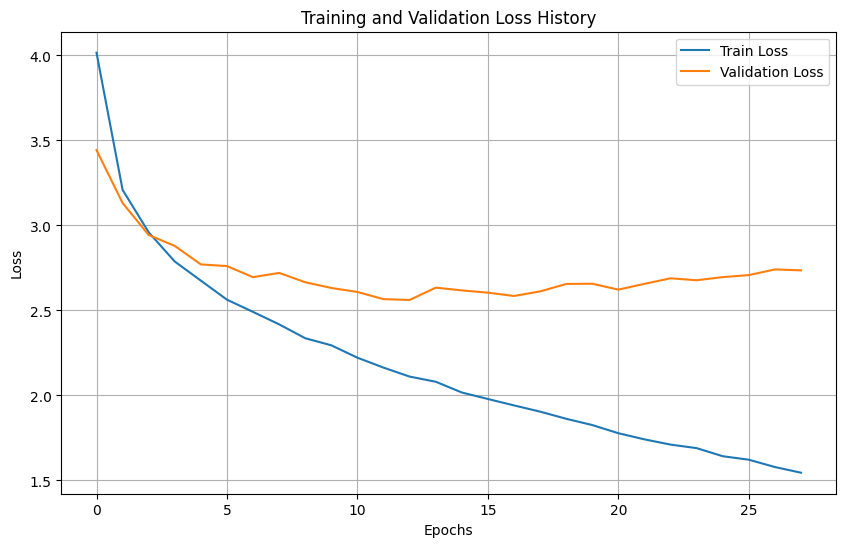

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch

def plot_loss_history(checkpoint_path):
    """
    Plots the training and validation loss from a saved checkpoint.
    """
    if os.path.exists(checkpoint_path):

        checkpoint = torch.load(checkpoint_path, map_location=torch.device('cpu'))

        train_loss = checkpoint.get('train_loss_history', [])
        val_loss = checkpoint.get('val_loss_history', [])

        if not train_loss or not val_loss:
            print("Loss history not found in the checkpoint.")
            return

        plt.figure(figsize=(10, 6))
        plt.plot(train_loss, label='Train Loss')
        plt.plot(val_loss, label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss History')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print(f"Checkpoint file not found at: {checkpoint_path}. Cannot plot history.")

plot_loss_history(checkpoint_file_transformer)

# Models Comparison

## Loss Curve Comparison: RNN vs. Transformer

This cell loads the training and validation loss histories for both the CNN+RNN and CNN+Transformer models from their respective checkpoints. It then visualizes these loss curves on a single plot, allowing for a direct comparison of their learning dynamics and validation performance over epochs.

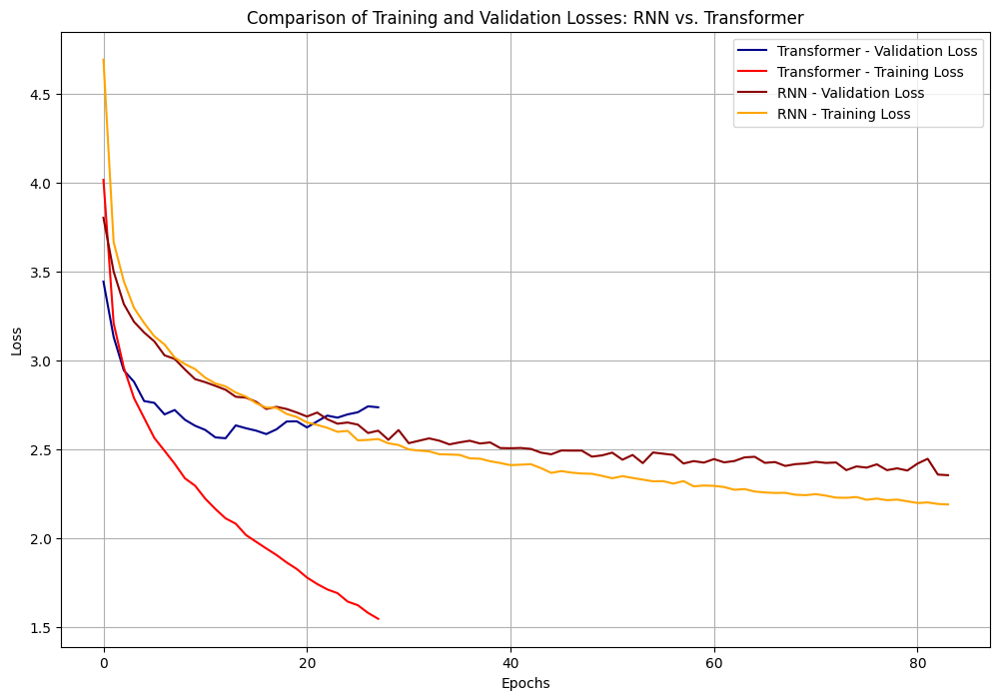

In [27]:
import torch
import matplotlib.pyplot as plt

# --- Load your checkpoint files ---
# Ensure these paths are correct
checkpoint_rnn = torch.load('/content/drive/MyDrive/CNN_RNN_model/checkpoint.pth')
checkpoint_transformer = torch.load('/content/drive/MyDrive/CNN_TRANSFORMER_model/checkpoint.pth')

# --- Extract loss histories ---
val_loss_rnn = checkpoint_rnn['val_loss_history']
train_loss_rnn = checkpoint_rnn['train_loss_history']

val_loss_transformer = checkpoint_transformer['val_loss_history']
train_loss_transformer = checkpoint_transformer['train_loss_history']

# --- Create the comparison plot with specified colors and styles ---
plt.figure(figsize=(12, 8))

# --- Plot Transformer curves ---
# Validation Loss: Solid line, dark blue
plt.plot(val_loss_transformer, label='Transformer - Validation Loss', color='darkblue')
# Training Loss: Solid line, light blue
plt.plot(train_loss_transformer, label='Transformer - Training Loss', color='red')

# --- Plot RNN curves (following the same analogy with red tones) ---
# Validation Loss: Solid line, dark red
plt.plot(val_loss_rnn, label='RNN - Validation Loss', color='darkred')
# Training Loss: Solid line, light red (lightcoral)
plt.plot(train_loss_rnn, label='RNN - Training Loss', color='orange')


plt.title('Comparison of Training and Validation Losses: RNN vs. Transformer')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Quantitative Evaluation: BLEU Score Analysis

This crucial section performs the final quantitative evaluation of both the CNN+RNN and CNN+Transformer models using the **BLEU-4 score** on the untouched `test_dataset`. This metric is preferred over validation loss for generative tasks as it assesses the linguistic quality and similarity of generated captions against human-written references.

The cell performs the following steps:

1.  **`generate_caption` Function:** This utility function is used to produce a single predicted caption for a given image, adapting its logic based on whether the input `model` is an RNN or a Transformer.
2.  **`evaluate_model_bleu` Function:**
    * Iterates through each image in the `test_dataset` (not the DataLoader).
    * For each image, it retrieves **all five human-written reference captions**.
    * It calls `generate_caption` to get the model's prediction.
    * It then calculates the BLEU-4 score using `nltk.translate.bleu_score.sentence_bleu`, comparing the single predicted caption against the **five reference captions**. This provides a much more robust and fair assessment than comparing against just one reference. A `SmoothingFunction` is used to prevent zero scores for short sentences.
    * The average BLEU score across all images in the test set is returned.
3.  **Model Instantiation and Loading:** Both `ImageCaptionGenerator` (RNN) and `TransformerImageCaptionGenerator` models are instantiated and their best-performing weights (saved during training based on validation loss) are loaded from their respective checkpoint files.
4.  **Final Evaluation:** The `evaluate_model_bleu` function is called for both models on the `test_dataset` to compute and print their final BLEU-4 scores.

The BLEU scores provide an objective measure of how well each model's generated captions match human-level descriptions, serving as the primary quantitative metric for comparing their performance.

In [28]:
!pip install nltk --quiet
print("NLTK is ready.")

import torch
import torch.nn as nn
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from tqdm import tqdm
import warnings

# Suppress NLTK warnings, as it can be verbose
warnings.filterwarnings("ignore")

# =============================================================================
# MODEL INSTANTIATION AND WEIGHT LOADING
# =============================================================================
print("Instantiating model architectures...")

# Instantiate the RNN model
model_rnn = ImageCaptionGenerator(
    embed_size=256,
    hidden_size=256,
    vocab_size=len(vocab),
    num_layers=1
).to(device)

# Instantiate the Transformer model
model_transformer = TransformerImageCaptionGenerator(
    embed_size=256,
    vocab_size=len(vocab),
    num_heads=8,
    num_layers=2,
    dropout=0.0
).to(device)

print("Architectures instantiated.")

print("Loading best model weights...")
# Load RNN weights from checkpoint
checkpoint_rnn = torch.load('/content/drive/MyDrive/CNN_RNN_model/checkpoint.pth', map_location=device)
model_rnn.load_state_dict(checkpoint_rnn['model_state_dict'])

# Load Transformer weights (assuming 'best_model.pth' stores only state_dict)
model_transformer.load_state_dict(torch.load('/content/drive/MyDrive/CNN_TRANSFORMER_model/best_model.pth', map_location=device))
print("Weights loaded successfully.")



NLTK is ready.
Instantiating model architectures...
Architectures instantiated.
Loading best model weights...
Weights loaded successfully.


# Qualitative Analysis: Best, Worst, and Random Captions

Beyond quantitative metrics like BLEU score, a qualitative analysis provides invaluable insights into how each model truly "sees" and describes images. This section aims to visually inspect and compare the generated captions.

The analysis is structured in three parts:

1.  **Preparation (`get_bleu_scores_per_image`):** This helper function first evaluates each model on every single image in the `test_dataset`. For each image, it generates a caption, calculates its individual BLEU score against all five ground truth references, and stores this information. The results are then sorted from best to worst BLEU score for each model.
    ```python
    # Example snippet from the function:
    # results.append({
    #     "image_name": image_name,
    #     "bleu_score": score,
    #     "predicted_caption": " ".join(predicted_caption_tokens),
    #     "reference_captions": reference_captions_text
    # })
    ```

2.  **Best and Worst Case Captions:**
    * For both the CNN+RNN and CNN+Transformer models, the **5 best-scoring** and **5 worst-scoring** images (based on their individual BLEU scores) are selected.
    * For each of these 20 examples (5 best/worst for RNN, 5 best/worst for Transformer), the original image is displayed, along with the model's predicted caption, its BLEU score, and all five human-provided ground truth captions.
    * This section helps to understand the strengths of each model (what they do well) and their specific failure modes (where they struggle the most).

3.  **Side-by-Side Comparison on Random Images:**
    * Five random images are chosen from the `test_dataset`.
    * For each random image, **both** the CNN+RNN and CNN+Transformer models generate a caption.
    * The original image is displayed, followed by the captions from *both models*, and then all five ground truth captions.
    * This direct side-by-side comparison allows for a nuanced understanding of how the two architectures differ in their descriptive abilities on a general, unbiased set of images. It helps to identify subtle differences in fluency, detail, and semantic understanding between the RNN's sequential processing and the Transformer's attention-based approach.

Together, these qualitative insights complement the quantitative BLEU scores, providing a holistic view of each model's performance characteristics.

In [29]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from tqdm import tqdm
import warnings
import numpy as np # Import numpy for easy averaging

# Remembered your preference and kept comments in English.

# =============================================================================
# --- ASSUME generate_caption_rnn and generate_caption_transformer ARE DEFINED ---
# (Make sure to paste your generate_caption_rnn and generate_caption_transformer functions here or in previous cells)
# Also, assume ImageCaptionGenerator and TransformerImageCaptionGenerator classes are defined.
# =============================================================================

def get_bleu_scores_per_image(model, dataset, device, vocab):
    """
    Calculates the BLEU-4 score for each image in the dataset and returns a list of results.
    It now dynamically uses generate_caption_rnn or generate_caption_transformer.
    """
    model.eval()

    results = []
    chencherry = SmoothingFunction()

    # Determine which generation function to use based on model type
    if isinstance(model, ImageCaptionGenerator):
        generate_caption_func = generate_caption_rnn
    elif isinstance(model, TransformerImageCaptionGenerator):
        generate_caption_func = generate_caption_transformer
    else:
        raise TypeError(f"Unsupported model type for caption generation: {model.__class__.__name__}")

    # Suppress NLTK's user warning about insufficient references (since we use smoothing)
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")

        for i in tqdm(range(len(dataset)), desc=f"Evaluating images for {model.__class__.__name__}"):
            image_tensor, _ = dataset[i]
            image_name = dataset.image_names[i]

            # --- CORREÇÃO AQUI: Garante que reference_captions_text seja sempre definida ---
            reference_captions_text = dataset.images_captions_dict[image_name]
            # --- FIM DA CORREÇÃO ---

            # Just move to device, let the generation func handle batch dim
            image_tensor = image_tensor.to(device)

            # Generate the predicted caption using the appropriate function
            predicted_caption_tokens = generate_caption_func(model, image_tensor, vocab, device)

            # Handle empty prediction to avoid errors
            if not predicted_caption_tokens:
                score = 0.0
            else:
                # Tokenize references
                reference_captions_tokens = [caption.split(" ") for caption in reference_captions_text]

                # Calculate BLEU score
                score = sentence_bleu(
                    reference_captions_tokens,
                    predicted_caption_tokens,
                    smoothing_function=chencherry.method1
                )

            # Store all the info
            results.append({
                "image_name": image_name,
                "bleu_score": score,
                "predicted_caption": " ".join(predicted_caption_tokens),
                "reference_captions": reference_captions_text
            })

    # Sort results by BLEU score (from best to worst)
    sorted_results = sorted(results, key=lambda x: x["bleu_score"], reverse=True)

    return sorted_results


# Get results for both models
results_rnn = get_bleu_scores_per_image(model_rnn, test_dataset, device, vocab)
results_transformer = get_bleu_scores_per_image(model_transformer, test_dataset, device, vocab)

# 1. Extract all per-image scores into a list
rnn_scores = [item["bleu_score"] for item in results_rnn]
transformer_scores = [item["bleu_score"] for item in results_transformer]

# 2. Calculate the overall average BLEU score
overall_bleu_rnn = np.mean(rnn_scores)
overall_bleu_transformer = np.mean(transformer_scores)

# 3. Print the overall results
print("\n" + "="*50)
print(f"OVERALL BLEU-4 SCORE ANALYSIS")
print("="*50)
print(f"Model RNN Overall BLEU Score:      {overall_bleu_rnn:.4f}")
print(f"Model Transformer Overall BLEU Score: {overall_bleu_transformer:.4f}")
print("="*50 + "\n")


# Get the 5 best and 5 worst of each model (This part remains the same)
best_captions_rnn = results_rnn[:5]
worst_captions_rnn = results_rnn[-5:]

best_captions_transformer = results_transformer[:5]
worst_captions_transformer = results_transformer[-5:]

print("Analysis done!")

Evaluating images for ImageCaptionGenerator: 100%|██████████| 1000/1000 [00:29<00:00, 34.44it/s]
Evaluating images for TransformerImageCaptionGenerator: 100%|██████████| 1000/1000 [00:45<00:00, 21.80it/s]


OVERALL BLEU-4 SCORE ANALYSIS
Model RNN Overall BLEU Score:      0.1322
Model Transformer Overall BLEU Score: 0.1640

Analysis done!


==================== TRANSFORMER MODEL ANALYSIS ====================

--- 5 BEST CAPTIONS (TRANSFORMER) ---


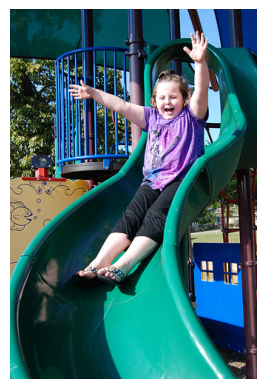

IMAGE: 2963573792_dd51b5fbfb.jpg
BLEU SCORE: 0.89

--- PREDICTED CAPTION ---
a little girl slide down a green slide .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A little girl slide down a green slide with her arm up at a playground .
A little girl slide down a slide at a playground .
A young girl be slide down a slide at a playground .
A young girl slide down a green plastic slide on a playground .
A girl be slide down a green slide .




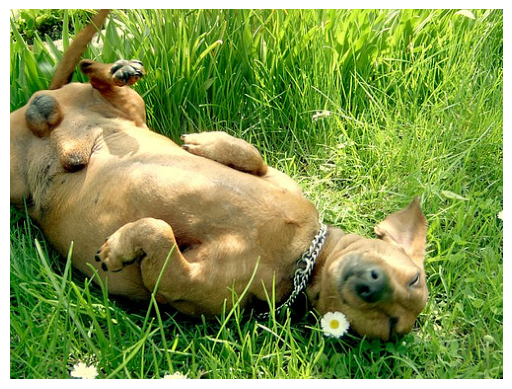

IMAGE: 229862312_1a0ba19dab.jpg
BLEU SCORE: 0.84

--- PREDICTED CAPTION ---
a brown dog be lay on its back in the grass .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A brown puppy be lay on its back in the grass .
A dog lay down in the long green grass .
A dog roll in the grass .
a dog roll in the grass .
A golden dog be lay on its back in the grass .




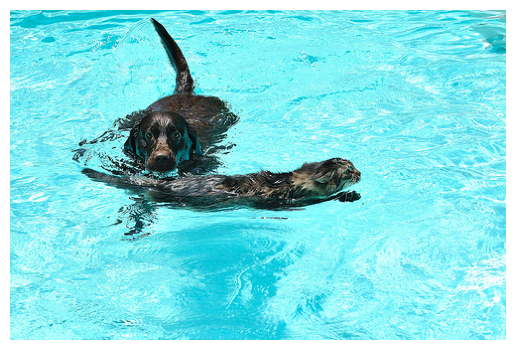

IMAGE: 2599444370_9e40103027.jpg
BLEU SCORE: 0.84

--- PREDICTED CAPTION ---
a dog swim in a pool .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A black dog paddle behind a black cat in a body of water .
A dog and a cat be swim in a swim pool .
Two black dog be dog paddle in a sparkle blue pool .
Two black dog be swim in a pool .
Two dog swim in a pool .




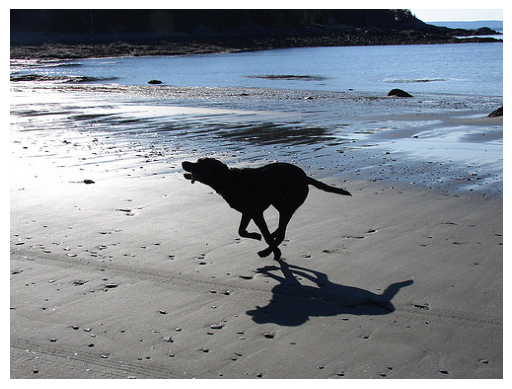

IMAGE: 3472364264_dbde5a8d0a.jpg
BLEU SCORE: 0.84

--- PREDICTED CAPTION ---
a dog run on a beach .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A dog play on a beach .
A dog run on a beach .
a large dog run on a beach with something hang out of its mouth .
A dog run across a beach .
A large black dog be run on the sand near a beach .




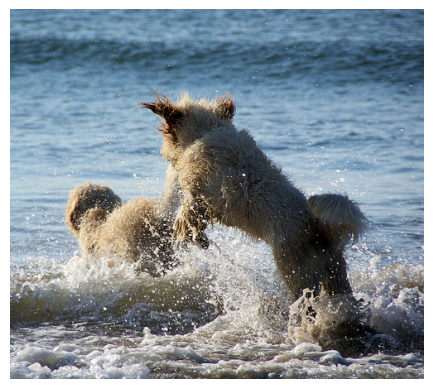

IMAGE: 3655155990_b0e201dd3c.jpg
BLEU SCORE: 0.81

--- PREDICTED CAPTION ---
two dog play in the water .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
Two dog play in the water .
Two dog play in the water , one be bound at the other .
Two furry beige dog play in ocean surf .
Two white dog be splash around in white wave .
Two white , longhaired dog play in the ocean



--- 5 WORST CAPTIONS (TRANSFORMER) ---


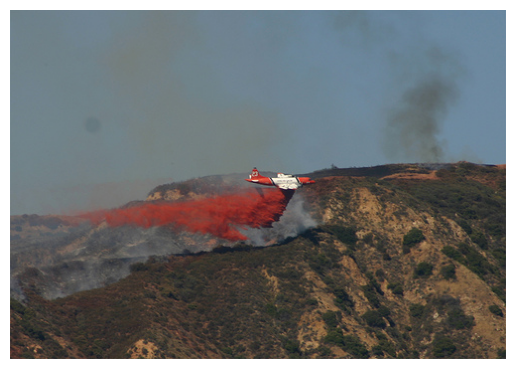

IMAGE: 3692593096_fbaea67476.jpg
BLEU SCORE: 0.02

--- PREDICTED CAPTION ---
a person be stand on top of a rock with a large rock in the background .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
Airplane emit heavy red colored smoke .
An airplane be fly over a mountain try to extinguish a fire .
A small plane be drop a red chemical over the mountaintops .
Red spray be be eject by an orange and white plane fly over the hilltop .
Small red airplane fly over mountaintop drop red substance over fire .




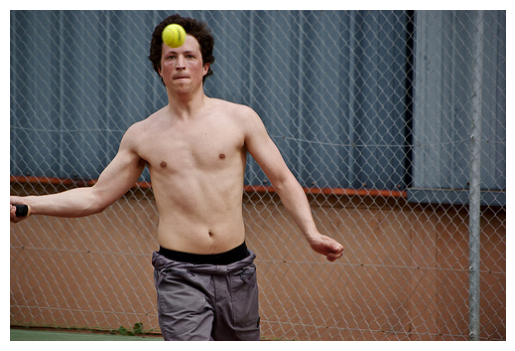

IMAGE: 2883099128_0b056eed9e.jpg
BLEU SCORE: 0.02

--- PREDICTED CAPTION ---
a man in a blue bathe suit be stand in front of a large body of water .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A man swing his racket at a tennis ball .
A man with no shirt be play tennis .
A man without a shirt play tennis .
A shirtless man be get ready to hit a tennis ball .
A shirtless man play tennis in an fenced-in area .




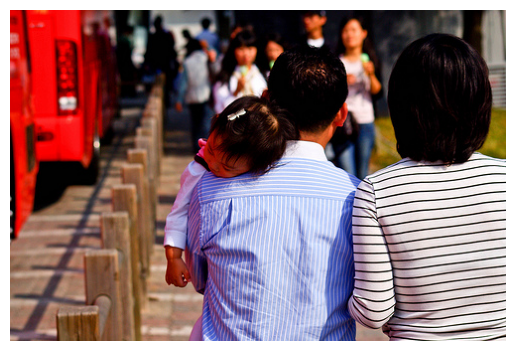

IMAGE: 2910758605_73a3f5a5c2.jpg
BLEU SCORE: 0.02

--- PREDICTED CAPTION ---
a group of person be stand around a red , white and blue coat look at something .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A couple be walk along a street while a man carry a toddler over one shoulder .
A couple be walk away while an infant sleep on a father 's shoulder .
A man carry a child while he walk with a woman .
A man hold a sleep child walk with a woman .
A man walk next to a woman up the step have a sleep child on his shoulder .




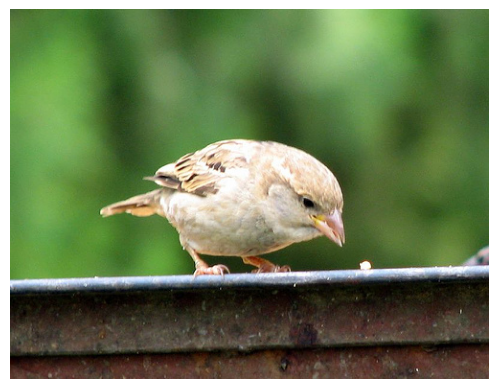

IMAGE: 308487515_7852928f90.jpg
BLEU SCORE: 0.01

--- PREDICTED CAPTION ---
a <UNK> , long haired , and a <UNK> be be be be be be be run .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A bird eat .
A small , pale bird bend down to examine a crumb .
A small white bird look at a small object .
A tan bird stand on a ledge about to eat something .
A bird lean over to a small piece of food .




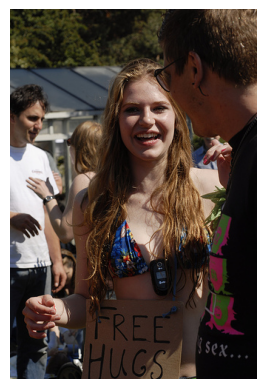

IMAGE: 523985664_c866af4850.jpg
BLEU SCORE: 0.01

--- PREDICTED CAPTION ---
a group of person with a <UNK> on their head , and a woman in black shirt and white short .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A girl in a bikini wear a sign say " free hug " .
A girl in a blue bikini be wear a cardboard sign around her neck .
A girl wear a swimsuit top wear a sign to give free hug .
a girl wear a sign that say " free hug " .
Woman in blue bikini wear a " free hug " sign .



==================== RNN MODEL ANALYSIS ====================

--- 5 BEST CAPTIONS (RNN) ---


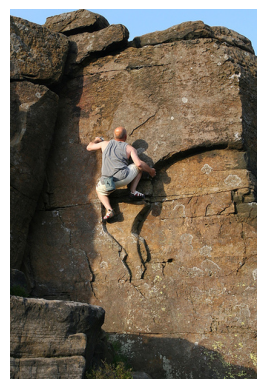

IMAGE: 309687244_4bdf3b591f.jpg
BLEU SCORE: 1.00

--- PREDICTED CAPTION ---
a man climb a rock face .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A man dress in gray climb a large brown rock .
A man in a gray shirt climb a large rock wall .
A man in short climb a rock face .
Man climb a rock wall .
The back of a man climb a rock .




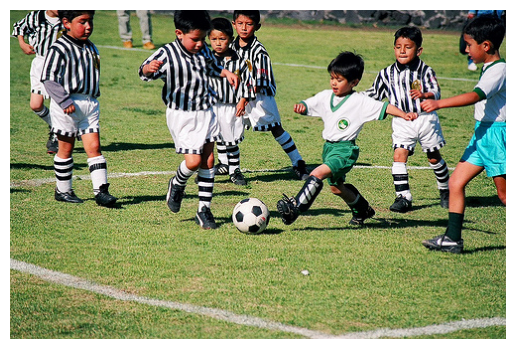

IMAGE: 2370481277_a3085614c9.jpg
BLEU SCORE: 0.87

--- PREDICTED CAPTION ---
a group of young boy play soccer .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A group of young boy play soccer .
A little boy in green be kick a soccer ball and 6 boy in referee shirt be follow him .
A young boy kick a soccer ball while six others play but be dress as referee .
Little boy play soccer on the field .
Small child kick a soccer ball on a soccer field .




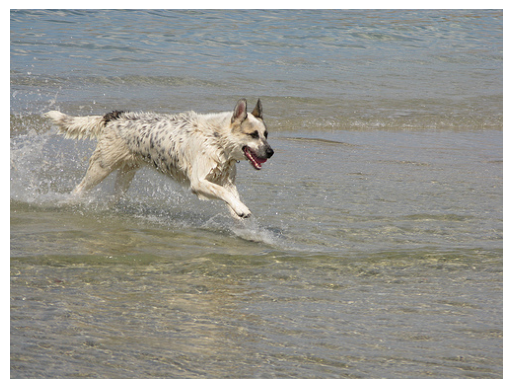

IMAGE: 2938747424_64e64784f0.jpg
BLEU SCORE: 0.80

--- PREDICTED CAPTION ---
a white dog be run through the water .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A pale colored dog run through a body of water .
A white dog be run through the water at a beach
A white dog be run through the water onto the shore .
A white dog run through the ocean .
White medium size dog be run through the ocean .




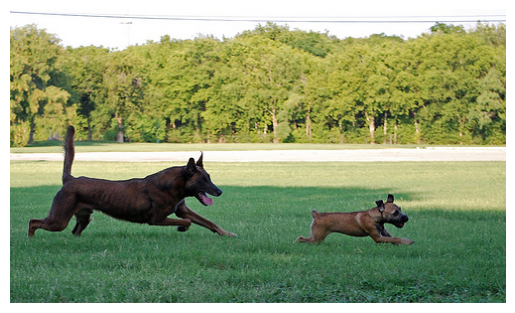

IMAGE: 2723477522_d89f5ac62b.jpg
BLEU SCORE: 0.76

--- PREDICTED CAPTION ---
a dog run through the grass .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A big dog chase a little dog on the grass .
A black dog be chase a small brown dog over grass .
A large brown dog be chase after a little brown dog .
Two brown dog run through the grass together .
two dog play in the grass .




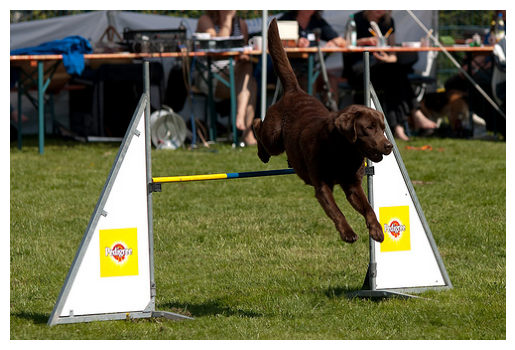

IMAGE: 3474406285_01f3d24b71.jpg
BLEU SCORE: 0.73

--- PREDICTED CAPTION ---
a dog jump over a hurdle .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
a brown dog jump over a blue and yellow stick .
A brown dog jump over a hurdle .
A brown dog jump over an obstacle .
A dog jump over a hurdle at a competition .
A brown dog be jump a hurdle over a yellow and black pole .



--- 5 WORST CAPTIONS (RNN) ---


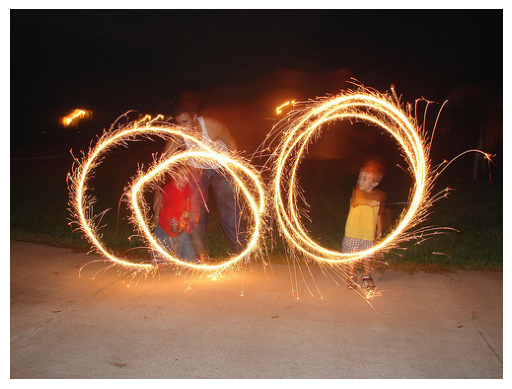

IMAGE: 3217266166_4e0091860b.jpg
BLEU SCORE: 0.02

--- PREDICTED CAPTION ---
a person in a red shirt be ride a bike on a dirt road .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
child play with large hoop .
Little kid play with sparkler at night .
Two small child be twirl sparkle rope .
Two young boy play with sparkler .
Two young child and an old man play with sparkler .




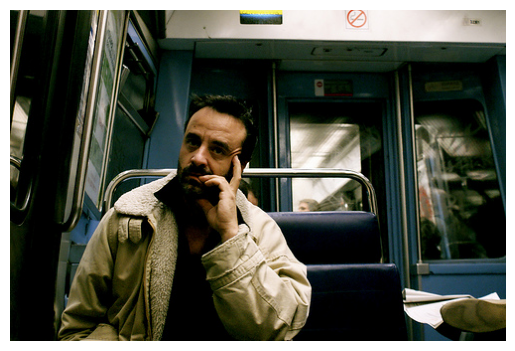

IMAGE: 2985679744_75a7102aab.jpg
BLEU SCORE: 0.01

--- PREDICTED CAPTION ---
a man in a white shirt and a black hat be stand in front of a brick wall .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A bearded man on a train
A man be sit on a train rest his hand against his face .
A man sit on a subway .
A man sit on a subway look at the camera .
A man sit on public transportation .




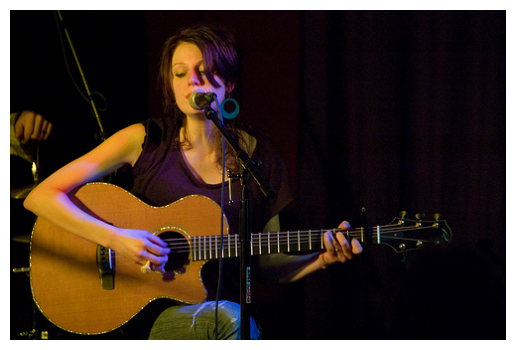

IMAGE: 3197981073_3156963446.jpg
BLEU SCORE: 0.01

--- PREDICTED CAPTION ---
a woman in a white shirt and a white shirt be hold a baby in a pink shirt .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A woman play an acoustic guitar with a microphone
A woman sing and play an acoustic guitar onstage .
A woman sing into a microphone while play guitar .
A young brown haired woman play her guitar and sings into a microphone .
A young woman play guitar and sings on a stage .




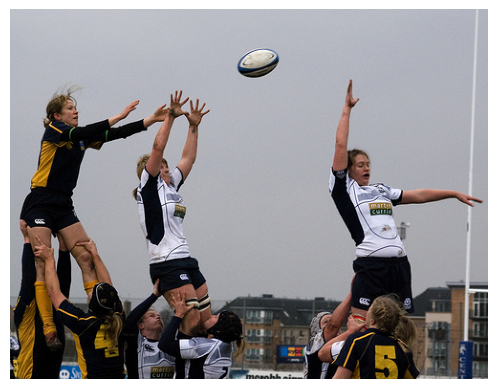

IMAGE: 3186412658_2ab2ebd397.jpg
BLEU SCORE: 0.01

--- PREDICTED CAPTION ---
a basketball player in a red uniform be tackle a player in a white uniform .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A group of woman hold each other up to catch a ball .
A woman 's sport squad perform some trick , include lift member high and toss a ball .
Team member be lift up high to catch a fly ball .
three young woman jump into the air to catch a ball .
Woman be lift by other woman play volleyball .




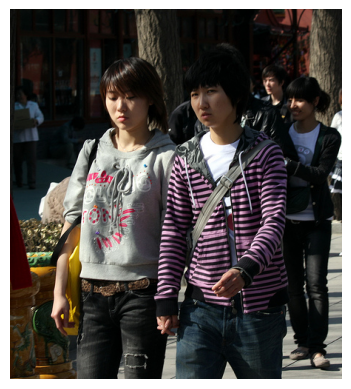

IMAGE: 3442242092_e579538d82.jpg
BLEU SCORE: 0.01

--- PREDICTED CAPTION ---
a man and a woman in a black shirt and a man in a black shirt be stand in front of a white building .

--- REFERENCE CAPTIONS (GROUND TRUTH) ---
A couple be walk down a sidewalk .
A couple walk down a city street hold hand .
An Asian girl wear a pink and black striped top be walk next to a girl in the gray top .
Two student walk down a street , hold hand .
Two woman be walk casually down a street together .




In [30]:
import matplotlib.pyplot as plt
import os

def display_analysis(caption_info, dataset):
    """Helper function to display an image and its caption analysis."""

    # Display the image
    image_path = os.path.join(dataset.image_folder_path, caption_info["image_name"])
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    # Print the analysis
    print(f"IMAGE: {caption_info['image_name']}")
    print(f"BLEU SCORE: {caption_info['bleu_score']:.2f}")
    print("\n--- PREDICTED CAPTION ---")
    print(caption_info["predicted_caption"])
    print("\n--- REFERENCE CAPTIONS (GROUND TRUTH) ---")
    for ref in caption_info["reference_captions"]:
        print(ref)
    print("\n" + "="*40 + "\n")

# --- Display results for both models ---

print("="*20 + " TRANSFORMER MODEL ANALYSIS " + "="*20)
print("\n--- 5 BEST CAPTIONS (TRANSFORMER) ---")
for item in best_captions_transformer:
    display_analysis(item, test_dataset)

print("\n--- 5 WORST CAPTIONS (TRANSFORMER) ---")
for item in worst_captions_transformer:
    display_analysis(item, test_dataset)

# --- RNN CODE IS HERE ---
print("\n" + "="*20 + " RNN MODEL ANALYSIS " + "="*20)
print("\n--- 5 BEST CAPTIONS (RNN) ---")
for item in best_captions_rnn:
    display_analysis(item, test_dataset)

print("\n--- 5 WORST CAPTIONS (RNN) ---")
for item in worst_captions_rnn:
    display_analysis(item, test_dataset)
# ---------------------------------------------



--- SIDE BY SIDE COMPARISON ---


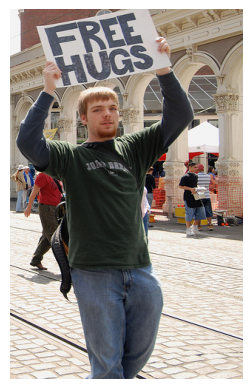

IMAGE: 476759700_8911f087f8.jpg
  RNN PREDICTION:       man in a red shirt be stand in front of a brick wall
  TRANSFORMER PREDICTION: man hold a sign <UNK> for a woman

--- GROUND TRUTH ---
a man carry a sign that say free hug along a sidewalk .
A man hold up a " free hug " sign above his head .
A man be hold a sign that say " Free Hug " .
A young man in a black shirt be hold a Free Hug sign .
A man be wear a green shirt and blue jean and carry a free hug sign .




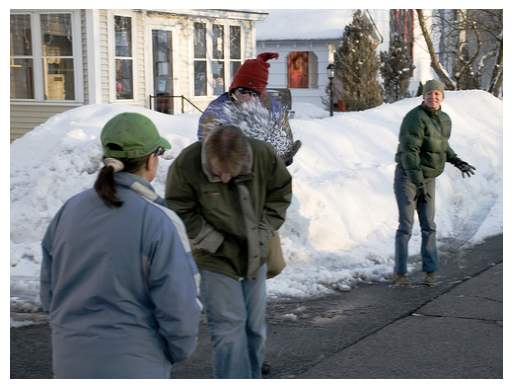

IMAGE: 2317714088_bcd081f926.jpg
  RNN PREDICTION:       man in a red shirt be stand in front of a large building
  TRANSFORMER PREDICTION: man and a woman be stand in front of a building

--- GROUND TRUTH ---
A person have just throw a snowball and hit someone in the back .
People outside a house in snow .
People stand outside a house .
Several person stand in front of a pile of snow in front of a house , with one person shovel .
Some person be gather by a mound of snow outside a house .




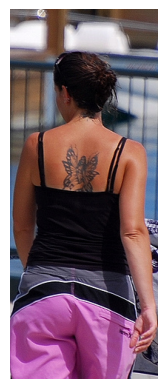

IMAGE: 2774554310_007e980a90.jpg
  RNN PREDICTION:       girl in a pink dress be dance in a parade
  TRANSFORMER PREDICTION: girl in a pink tank top and jean be jump up in a trampoline

--- GROUND TRUTH ---
A woman dress in black and pink have a large tattoo on her back .
A woman in pink pants and a black tank top display a tattoo on her back .
a woman wear a black tank top reveal a large fairy tattoo .
A woman with a tattoo on her back walk away from the camera .
A woman wear pink pants have a tattoo of a butterfly on her back .




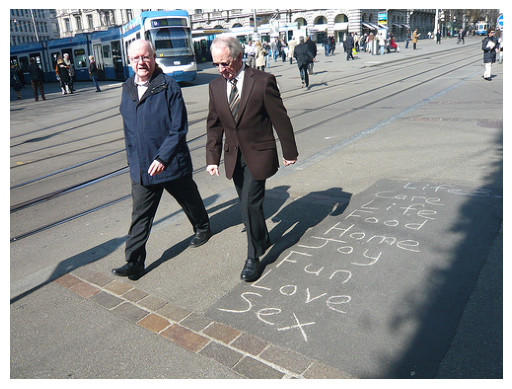

IMAGE: 3365783912_e12c3510d8.jpg
  RNN PREDICTION:       man in a red shirt be walk down a street
  TRANSFORMER PREDICTION: person be walk down a city street

--- GROUND TRUTH ---
Two elderly person walk down a city sidewalk by words write in chalk .
Two man walk along a busy city street with words print on a sidewalk .
Two man walk through a city with words on a street .
Two old man in business attire be walk in a city , text graffiti be visible on a sidewalk .
Two person walk down a city street that have writing on it .




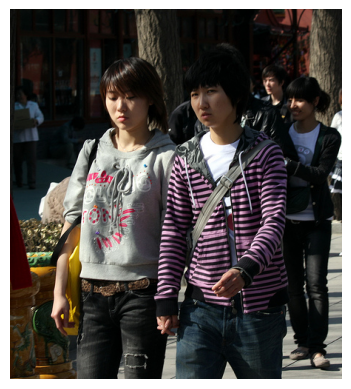

IMAGE: 3442242092_e579538d82.jpg
  RNN PREDICTION:       man and a woman in a black shirt and a man in a black shirt be stand in front of a white building
  TRANSFORMER PREDICTION: group of man stand outside a red shop

--- GROUND TRUTH ---
A couple be walk down a sidewalk .
A couple walk down a city street hold hand .
An Asian girl wear a pink and black striped top be walk next to a girl in the gray top .
Two student walk down a street , hold hand .
Two woman be walk casually down a street together .




In [33]:
import numpy as np

print("\n\n--- SIDE BY SIDE COMPARISON ---")

for _ in range(5): # Loop para 5 imagens aleatórias

    # Get a random image
    idx = np.random.randint(0, len(test_dataset))
    image_tensor, _ = test_dataset[idx]
    image_name = test_dataset.image_names[idx]

    # Generate captions from both models
    pred_rnn = " ".join(generate_caption_rnn(model_rnn, image_tensor, vocab, device)[1:-1])
    pred_transformer = " ".join(generate_caption_transformer(model_transformer, image_tensor, vocab, device)[1:-1])

    # Display the image
    image_path = os.path.join(test_dataset.image_folder_path, image_name)
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    # Print captions
    print(f"IMAGE: {image_name}")
    print(f"  RNN PREDICTION:       {pred_rnn}")
    print(f"  TRANSFORMER PREDICTION: {pred_transformer}")
    print("\n--- GROUND TRUTH ---")
    for ref in test_dataset.images_captions_dict[image_name]:
        print(ref)
    print("\n" + "="*40 + "\n")

## Trainable parameters

In [34]:
# Compute the number of trainable parameters
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

params_rnn = count_parameters(model_rnn)
params_transformer = count_parameters(model_transformer)

print(f"Number of trainable parameters(CNN+RNN): {params_rnn:,}")
print(f"Number of trainable parameters (CNN+Transformer): {params_transformer:,}")

Number of trainable parameters(CNN+RNN): 2,087,653
Number of trainable parameters (CNN+Transformer): 4,718,821
